# Fastai - Classification

In [ ]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
from fastai.vision import *
from fastai.metrics import error_rate

In [ ]:
bs = 64
# bs = 16   # uncomment this line if you run out of memory even after clicking Kernel->Restart

## Oxford IIIT Pet Dataset

We are going to use the [Oxford-IIIT Pet Dataset](http://www.robots.ox.ac.uk/~vgg/data/pets/) which features 12 cat breeds and 25 dogs breeds. Our model will need to learn to differentiate between these 37 distinct categories. According to their paper, the best accuracy they could get in 2012 was 59.21%, using a complex model that was specific to pet detection, with separate "Image", "Head", and "Body" models for the pet photos

`untar_data` function to which we must pass a URL as an argument and it will download and extract the data

In [ ]:
path = untar_data(URLs.PETS); path

PosixPath('/home/sgugger/.fastai/data/oxford-iiit-pet')

In [ ]:
path.ls()

[PosixPath('/home/sgugger/.fastai/data/oxford-iiit-pet/images'),
 PosixPath('/home/sgugger/.fastai/data/oxford-iiit-pet/annotations')]

In [ ]:
path_anno = path/'annotations'
path_img = path/'images'

The main difference between the handling of image classification datasets is the way labels are stored. In this particular dataset, labels are stored in the filenames themselves. We will need to extract them to be able to classify the images into the correct categories.

`get_image_files` will just grab an array of all of the image files based on extension in a path.

In [ ]:
fnames = get_image_files(path_img)
fnames[:5]

[PosixPath('/home/ubuntu/.fastai/data/oxford-iiit-pet/images/saint_bernard_188.jpg'),
 PosixPath('/home/ubuntu/.fastai/data/oxford-iiit-pet/images/staffordshire_bull_terrier_114.jpg'),
 PosixPath('/home/ubuntu/.fastai/data/oxford-iiit-pet/images/Persian_144.jpg'),
 PosixPath('/home/ubuntu/.fastai/data/oxford-iiit-pet/images/Maine_Coon_268.jpg'),
 PosixPath('/home/ubuntu/.fastai/data/oxford-iiit-pet/images/newfoundland_95.jpg')]

In [ ]:
np.random.seed(2)
pat = r'/([^/]+)_\d+.jpg$'

`ImageDataBunch` 

Hierarchy of modules-

`fastai.vision.data.ImageDataBunch`

`ImageDataBunch.from_name_re` is going to return a DataBunch object. 

In fastai, everything you model with is going to be a DataBunch object. DataBunch object contains 2 or 3 datasets - it contains your training data, validation data, and optionally test data. For each of those, it contains your images and your labels.


`ImageDataBunch.from_name_re` gets the labels from the filenames using a [regular expression](https://docs.python.org/3.6/library/re.html).


In [ ]:
data = ImageDataBunch.from_name_re(path_img, fnames, pat, ds_tfms=get_transforms(), size=224, bs=bs
                                  ).normalize(imagenet_stats)

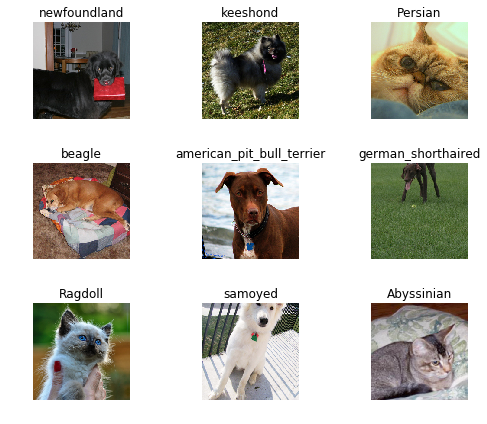

In [ ]:
data.show_batch(rows=3, figsize=(7,6))

In [ ]:
print(data.classes)
len(data.classes),data.c

['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British_Shorthair', 'Egyptian_Mau', 'Maine_Coon', 'Persian', 'Ragdoll', 'Russian_Blue', 'Siamese', 'Sphynx', 'american_bulldog', 'american_pit_bull_terrier', 'basset_hound', 'beagle', 'boxer', 'chihuahua', 'english_cocker_spaniel', 'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger', 'miniature_pinscher', 'newfoundland', 'pomeranian', 'pug', 'saint_bernard', 'samoyed', 'scottish_terrier', 'shiba_inu', 'staffordshire_bull_terrier', 'wheaten_terrier', 'yorkshire_terrier']


(37, 37)

## Training: resnet34

Now we will start training our model. We will use a [convolutional neural network](http://cs231n.github.io/convolutional-networks/) backbone and a fully connected head with a single hidden layer as a classifier.

Training for 4 epochs:-

In [ ]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

In fastai, the model is trained by a learner.
`cnn_learner` method resides in `fastai.vision.learner` class.

<b>When you call `cnn_learner` first time, it downloads resnet34 pre-trained weights.</b>

Pre-trained means this particular model has been already trained for the particular task, and that task is training on 1.5 million pictures of 1000 different categories of objects like plants, animals, people, cars, etc. using image dataset called <b>Imagenet.</b>

So we don’t necessarily start with a model that knows nothing about images, but we start with knowledge of images of 1000 categories.


## Transfer Learning


It is important to understand fastai’s focus on transfer learning.

<b>We will take a pre-trained model and then we fit it so that instead of predicting a 1000 categories of ImageNet with ImageNet data, it predicts the 37 categories of pets using the pet data.</b>

By doing this, you can train models in 1/100 or less of the time of regular model training with 1/100 or less of the data of regular model training.


Transfer learning is the most important single thing to be able to use deep learning effectively. 

<b>You almost never would need to start with random weights unless nobody had ever trained a model on a vaguely similar dataset with an even remotely connected kind of problem to solve as what you are doing — which almost never happens. </b>

Fastai library focuses on transfer learning which makes it different from other libraries. The basic idea of transfer learning is:

1. Given a network that does thing A, remove the last layer.

2. Replace it with a few random layers at the end

3. Fine-tune those layers to do thing B while taking advantage of the features that the original network learned

4. Then optionally fine tune the whole thing end-to-end and you now have something which probably uses orders of magnitude less data, is more accurate, and trains a lot faster.


In [ ]:
learn.model

Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (rel

In [ ]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate
1,1.409939,0.357608,0.102165
2,0.539408,0.242496,0.073072
3,0.340212,0.221338,0.066306
4,0.261859,0.216619,0.071042


`fit_one_cycle` method fits a model following  <b> One Cycle Policy.</b>

It accepts `cycle_len` which is an integer describing how many times you want to pass through the complete dataset i.e. epochs

Note: Now when we say we are training a model we are just creating a set of weights i.e. finding a set of coefficients in case of linear or logistic regression.

In [ ]:
learn.save('stage-1')

## Analyzing Results

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

## Classification Interpretation

This class has methods for creating confusion matrix as well as plotting misclassified images.


## Plot Top Losses

This loss function tells you how good was your prediction compared to the ground truth.


Specifically, that means if you predicted one class of dog with great confidence.

For example, if you confidently predicted an image is of a Boxer, but it was wrong. It is actually a Pug. Then it is going to have a very high loss because you were very confident about the wrong answer.

<b>So by plotting the top losses, we are going to plot images that we were most confident about the prediction but were wrong.</b>


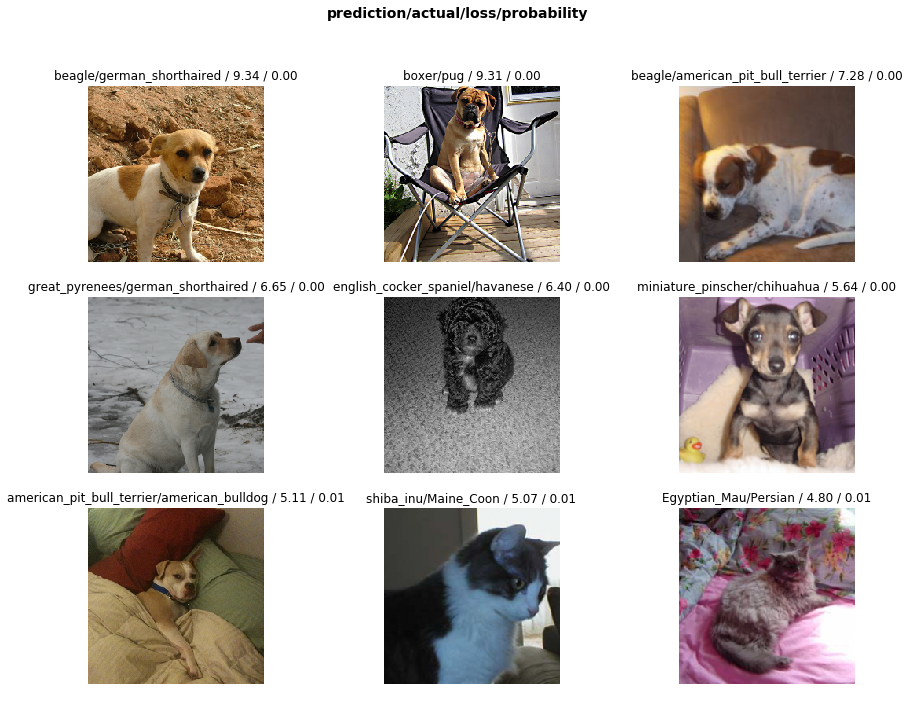

In [ ]:
interp.plot_top_losses(9, figsize=(15,11))

In [ ]:
doc(interp.plot_top_losses)

## Confusion Matrix

Dark diagonal means everything got correctly predicted.

We can see that the distribution is heavily skewed: the model makes the same mistakes over and over again but it rarely confuses other categories. This suggests that it just finds it difficult to distinguish some specific categories between each other; this is normal behaviour.

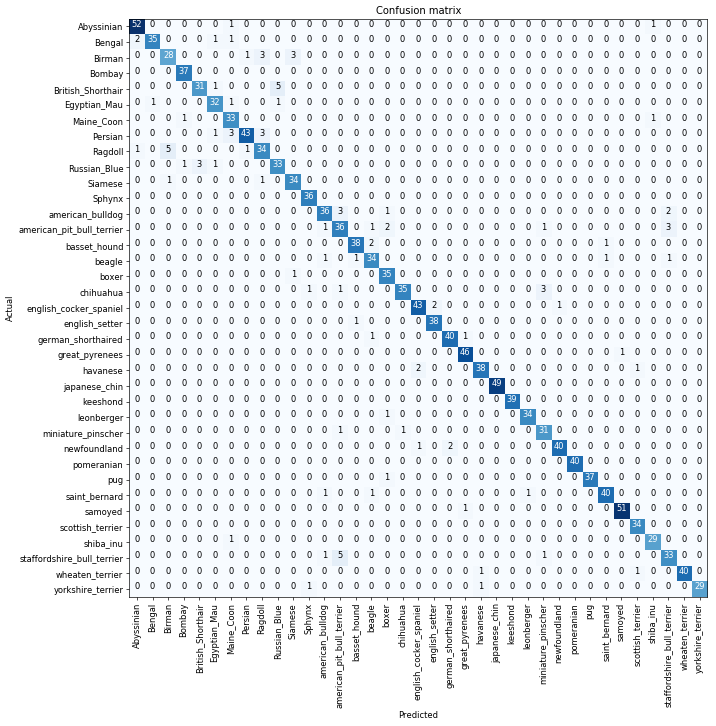

In [ ]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

## Most Confused

If you have got lots of classes, don’t use a confusion matrix, instead use named function by fastai called `most_confused`

`most_confused` will simply grab out of the confusion matrix the particular combinations of predicted and actual that got wrong the most often.


In [ ]:
interp.most_confused(min_val=2)

[('British_Shorthair', 'Russian_Blue', 5),
 ('Ragdoll', 'Birman', 5),
 ('staffordshire_bull_terrier', 'american_pit_bull_terrier', 5),
 ('Birman', 'Ragdoll', 3),
 ('Birman', 'Siamese', 3),
 ('Persian', 'Maine_Coon', 3),
 ('Persian', 'Ragdoll', 3),
 ('Russian_Blue', 'British_Shorthair', 3),
 ('american_bulldog', 'american_pit_bull_terrier', 3),
 ('american_pit_bull_terrier', 'staffordshire_bull_terrier', 3),
 ('chihuahua', 'miniature_pinscher', 3)]

## Making Model Better

So far we have fitted 4 epochs and it ran pretty quickly. Because we used a little trick called transfer learning.

We added a few extra layers at the end of architecture, and we only trained those. 

We left most of the early layers as they were. This is called <b>freezing layers</b> i.e weights of the layers. 
So that is the reason it was so fast.

Now we want to go back and train the whole model. For this we always use <b>2-state process.</b>
1.	When we <b>call fit or fit_one_cycle()</b> on a cnn_learner, it will just fine-tune these extra layers at the end, and run very fast.
2.	It will never overfit, but to get it good, you have to <b>call unfreeze()</b>


## Unfreezing, fine-tuning, and learning rates

Since our model is working as we expect it to, we will *unfreeze* our model and train some more.

In [ ]:
learn.unfreeze()

In [ ]:
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,error_rate
1,0.558166,0.314579,0.101489


<b> unfreeze() says train the whole model again. </b>

Then again we have to call fit_one_cycle() <b> but the error we got now is much worse.</b>

To understand why the error got worse let us break out model and look into the layers.


## Visualizing CNN

These pictures come from a fantastic paper, [Visualizing and Understanding Convolutional Networks](https://cs.nyu.edu/~fergus/papers/zeilerECCV2014.pdf) by Matt Zeiler who nowadays is a CEO of Clarify which is a very successful computer vision startup and his supervisor for his PhD Rob Fergus.

A CNN can have upto 1000 layers neural network. ResNet34 has 34 layers, ResNet50 has 50. Let us look at <b>LAYER 1</b>



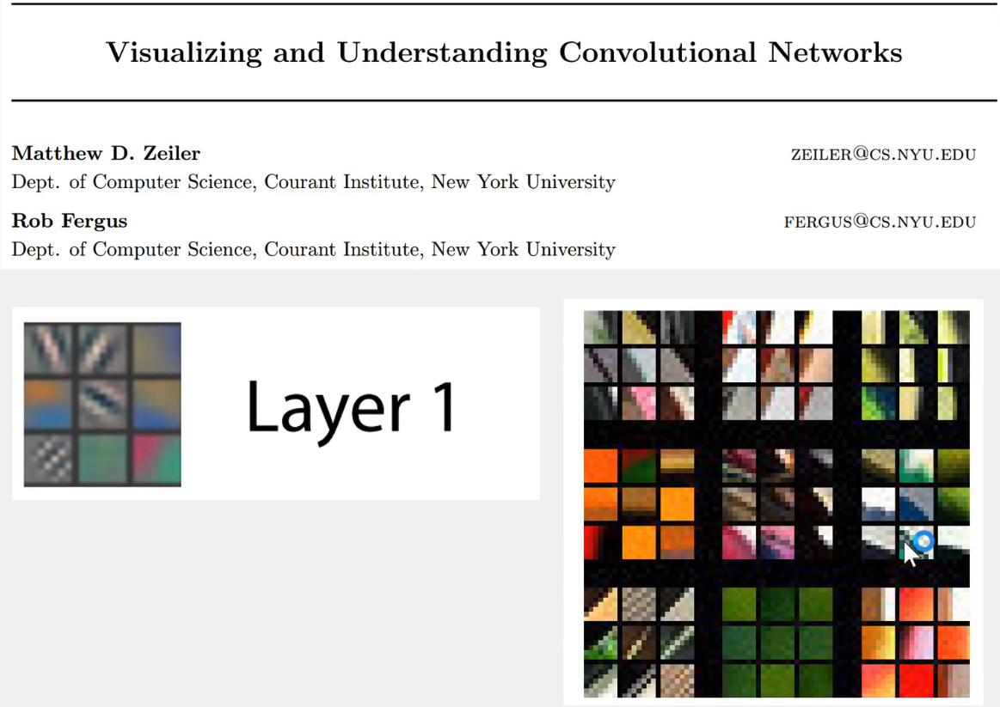


There are a dozen of coefficients in the first layer, let us have a look at random 9 of them. These operate on groups of pixels that are next to each other. So this first one basically finds groups of pixels that have a little diagonal line, the second one finds diagonal line in the other direction, the third one finds gradients that go from yellow to blue, and so forth.

They are very simple little filters. That's layer one of ImageNet pre-trained convolutional neural net.




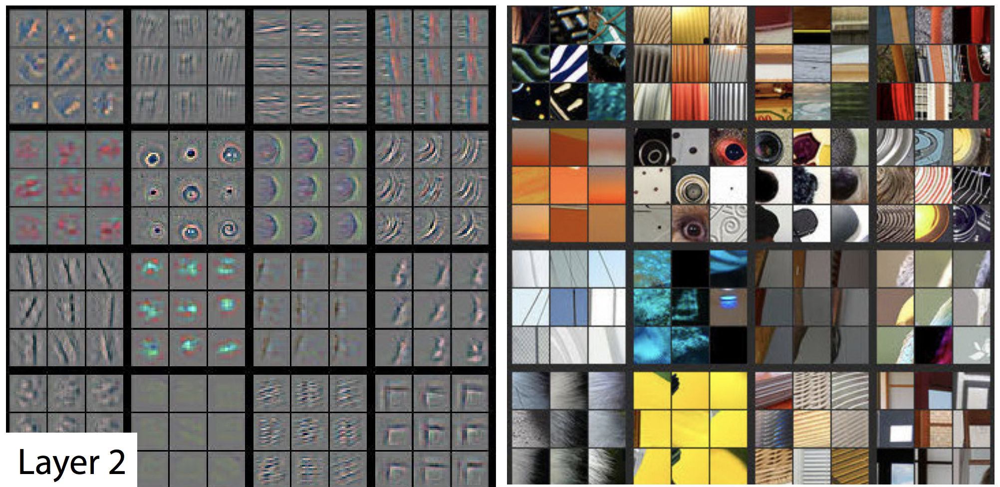


Layer 2 takes the results of those filters and does a second layer of computation. The bottom right are nine examples of a way of visualizing one of the second layer features. As you can see, it basically learned to create something that looks for top left corners.

In layer one, we have things that can find just one line, and in layer 2, we can find things that have two lines joined up or one line repeated.





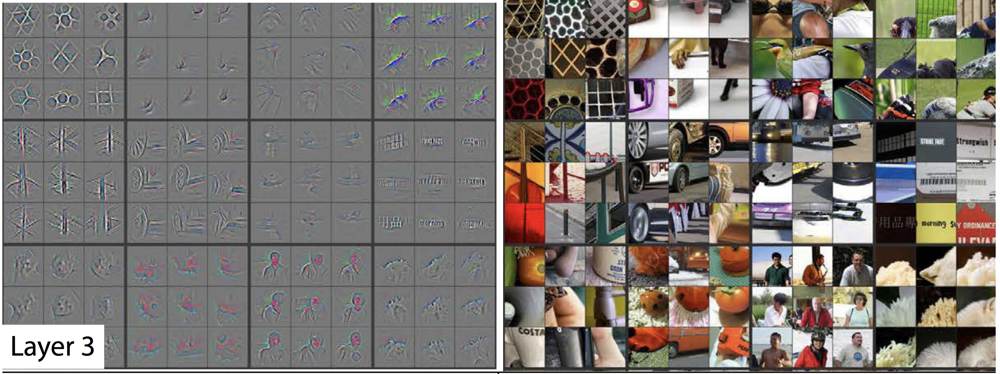



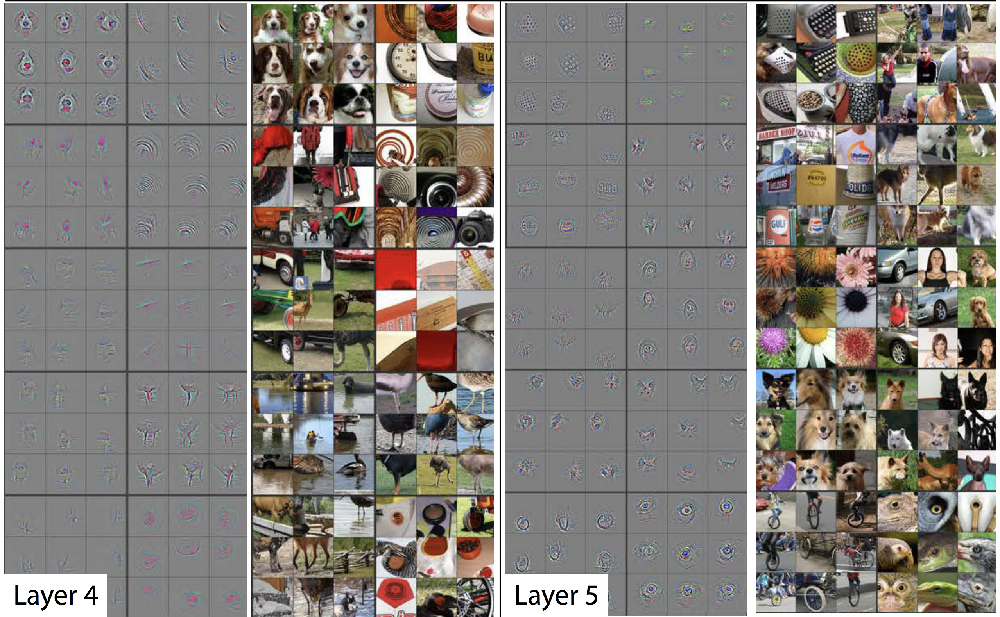

Layer 4 can take all the stuff from layer 3 and combine them together. By layer 4, we got something that can find dog faces or bird legs.


By layer 5, we've got something that can find the eyeballs of bird and lizards, or faces of particular breeds of dogs and so forth. 

So you can see how by the time you get to layer 34, you can find specific dog breeds and cat breeds. This is kind of how it works.

So when we first trained (i.e. fine-tuned) the pre-trained model, we kept all of these layers that you've seen so far and we just trained a few more layers on top of this.

So now we are going back and saying "let's change all of these". We will start with where they started with.


<b>This is why our attempt to fine-tune this model didn't work because by default, it trains all the layers at the same speed </b> which is to say it will update those things representing diagonal lines and gradients just as much as it tries to update the things that represent the exact specifics of what an eyeball looks like.


In [ ]:
learn.load('stage-1');

In [ ]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


## Learning Rate Finder

Learning Rate Finder finds the fastest rate we can train the neural network without it getting blow apart.

<b>Learning Rate says how quickly are we updating the parameters in our model.</b>



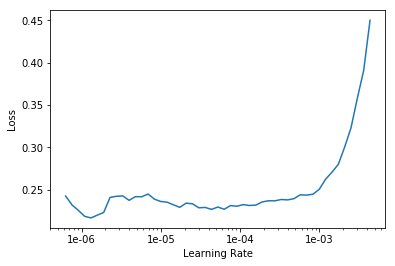

In [ ]:
learn.recorder.plot()

There’s no point training all the layers at that rate because we know that the later layers worked just fine before when we were training much more quickly. So what we can do is we can pass a range of learning rates to learn.fit_one_cycle.

## Pick Learning Rate
The basic rule of thumb is after you unfreeze (i.e. train the whole thing), pass a max learning rate parameter, pass it a slice, make the first parameter about 10 times smaller than the second for your range.

In [ ]:
learn.unfreeze()
learn.fit_one_cycle(2, max_lr=slice(1e-6,1e-4))

epoch,train_loss,valid_loss,error_rate
1,0.242544,0.208489,0.067659
2,0.206940,0.204482,0.062246


## One Cycle Policy

•	It defines <b>a cycle of two steps</b> with equal lengths –

1. One going from a lower learning rate to a higher learning rate

2. Then one going back to minimum rate from the highest.


•	The maximum should be the value picked with the Learning Rate Finder, and the lower one can be ten times lower.


•	The length of this cycle should be slightly less than the total number of epochs.

•	Start slower, using a lower learning rate value to warm-up the training is often the practice. Leslie Smith recommends to take as much time going up as going down, linearly.

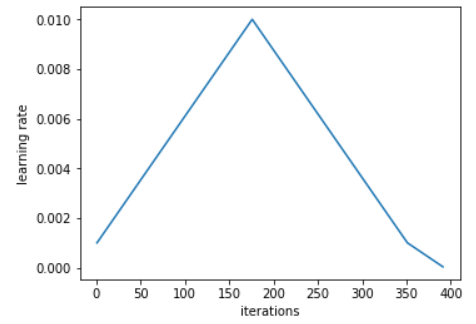

•	What he observed during his experiments is that the during the <b>middle of the cycle, the high learning rates will act as regularization method</b>, and keep the network from overfitting. This will prevent the model to land in a steep area of the loss function.



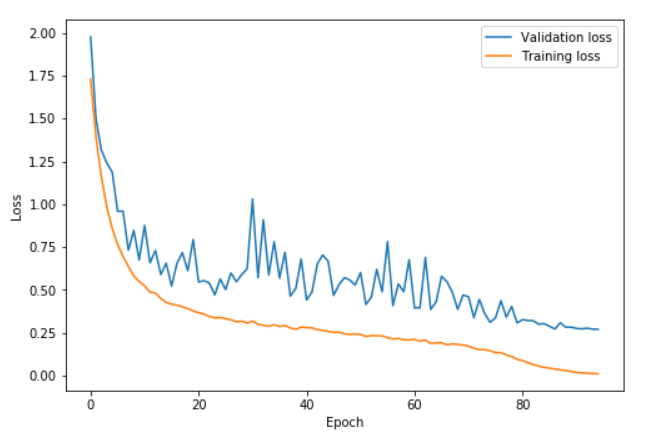



•	<b>During the high learning rate values</b>, we don't see substantial improvements in the loss and the validation loss sometimes spikes very high, but we see all the benefits of doing this when we finally lower the learning rates at the end.


•	In this graph, the learning rate was rising from 0.08 to 0.8 between epochs 0 and 41, getting back to 0.08 between epochs 41 and 82 then going to one hundredth of 0.08 in the last few epochs. The validation loss gets a little bit more volatile during the high learning rate part of the cycle (epochs 20 to 60 mostly) but the important part is that on average, the distance between the training loss and the validation loss doesn't increase.


•	This policy  <b>allows us to pick larger maximum learning rates, closer to the minimum loss</b>. Those trainings are a bit more dangerous in the sense that the loss can go too far away and make the whole thing diverge. In those cases, it can be worth <b>to try with a longer cycle before going to a slower learning rate, since a long warm-up seems to help.</b>


•	<b>Super Convergence</b> - With very high learning rates, we get to learn faster and prevent overfitting. The difference between the validation loss and the training loss stays extremely low up until we annihilate the learning rates.


•	By opposition, a smaller cycle followed by a longer annihilation will result in something like this:

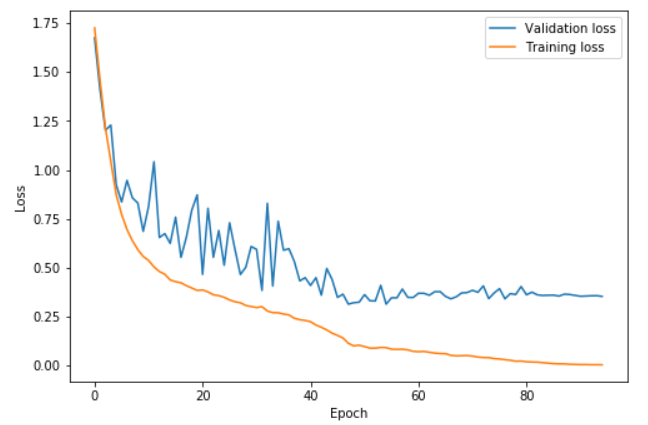


<b>Underfitting</b> – If your training loss is greater than validation loss then it means you are underfitting. 


Your training loss should always be lower than validation loss. 

To fix this you can :

•	Train for longer

•	Train the last bit at lower learning rate

## Training With ResNet50


Basically, resnet50 usually performs better because it is a deeper network with more parameters. To help it along, let's us use larger images too, since that way the network can see more detail. We reduce the batch size a bit since otherwise this larger network will require more GPU memory.

In [ ]:
data = ImageDataBunch.from_name_re(path_img, fnames, pat, ds_tfms=get_transforms(),
                                   size=299, bs=bs//2).normalize(imagenet_stats)

In [ ]:
learn = cnn_learner(data, models.resnet50, metrics=error_rate)

LR Finder complete, type {learner_name}.recorder.plot() to see the graph.


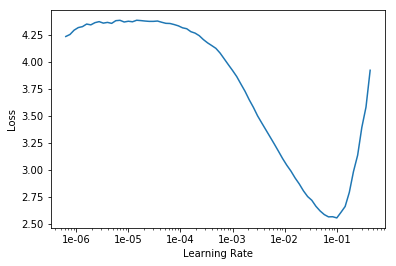

In [ ]:
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(8)

Total time: 06:59
epoch  train_loss  valid_loss  error_rate
1      0.548006    0.268912    0.076455    (00:57)
2      0.365533    0.193667    0.064953    (00:51)
3      0.336032    0.211020    0.073072    (00:51)
4      0.263173    0.212025    0.060893    (00:51)
5      0.217016    0.183195    0.063599    (00:51)
6      0.161002    0.167274    0.048038    (00:51)
7      0.086668    0.143490    0.044655    (00:51)
8      0.082288    0.154927    0.046008    (00:51)



In [ ]:
learn.save('stage-1-50')

In [ ]:
learn.unfreeze()
learn.fit_one_cycle(3, max_lr=slice(1e-6,1e-4))

Total time: 03:27
epoch  train_loss  valid_loss  error_rate
1      0.097319    0.155017    0.048038    (01:10)
2      0.074885    0.144853    0.044655    (01:08)
3      0.063509    0.144917    0.043978    (01:08)



In [ ]:
learn.load('stage-1-50');

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

In [ ]:
interp.most_confused(min_val=2)

[('american_pit_bull_terrier', 'staffordshire_bull_terrier', 6),
 ('Bengal', 'Egyptian_Mau', 5),
 ('Bengal', 'Abyssinian', 4),
 ('boxer', 'american_bulldog', 4),
 ('Ragdoll', 'Birman', 4),
 ('Egyptian_Mau', 'Bengal', 3)]